In [1]:
# Import necessary libs
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
import numpy as np
import os
from tensorflow import keras
from  shutil import copyfile
import random
import zipfile

In [3]:
# This is done for running notebook in google collab and reading the data from Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [11]:
zip_data = "/content/drive/MyDrive/Food-5K.zip"

zip_ref = zipfile.ZipFile(zip_data, 'r')
zip_ref.extractall("./")
zip_ref.close()

In [6]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img

In [7]:
import matplotlib.pyplot as plt

In [9]:
# Converting the images into 2 sub folders. This is the format ImageGenerator takes.
def data_process(directory,path):

    if os.path.isdir('directory'):
        return

    data_non_food =os.path.join(directory , '0')
    data_food     =os.path.join(directory , '1')



    os.mkdir(directory)
    os.mkdir(data_non_food)
    os.mkdir(data_food)

    non_food_images=[]
    food_images=[]

    for file in os.listdir(path):
        if file[0]=='0':
            non_food_images.append(file)
        elif file[0]=='1':
            food_images.append(file)

    random.sample(non_food_images, len(non_food_images))
    random.sample(food_images, len(food_images))

    print(len(non_food_images))
    print(len(food_images))


    for file in non_food_images:
#         print(file)
        copyfile(os.path.join(path,file), os.path.join(data_non_food,file))

    for file in food_images:
        copyfile(os.path.join(path, file), os.path.join(data_food, file))


In [13]:
data_process("./train_data","./Food-5K/training/")

1500
1500


In [ ]:
data_process("./val_data","./Food-5K/validation/")

In [15]:
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

In [16]:
train_image_generator = ImageDataGenerator(rescale=1./255) # Generator for our training data

In [17]:
validation_image_generator = ImageDataGenerator(rescale=1./255) # Generator for our validation data

In [18]:
train_data_gen = train_image_generator.flow_from_directory(batch_size=32,
                                                     directory="./train_data",
                                                     shuffle=True,
                                                     target_size=(128, 128),
                                                     class_mode='binary')

val_data_gen = validation_image_generator.flow_from_directory(batch_size=32,
                                                              directory="./val_data",
                                                              target_size=(128, 128),
                                                              class_mode='binary')

Found 3000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [19]:
from sklearn.metrics import f1_score , accuracy_score

In [20]:
from tensorflow.keras import layers, models, callbacks

In [21]:
!pip install -q -U keras-tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.5/129.5 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 10.5 MB/s eta 0:00:00


In [208]:
import keras_tuner as kt

In [293]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [286]:
# Build model for hyper parameter tuning.
def build_model(hp):

  model = tf.keras.Sequential()
  # model.add(layers.InputLayer(input_shape=(128,128,3)))

  for i in range(hp.Int('num_layers', min_value=1, max_value=3)):

    model.add(layers.Conv2D(filters=hp.Int(f'filters_{i}', min_value=16, max_value=128, step = 32),
                            kernel_size=hp.Choice(f'conv_kernel_{i}', values = [3,5]),
                            activation='relu'))

    model.add(layers.MaxPooling2D())

  model.add(tf.keras.layers.Flatten())
  model.add(tf.keras.layers.Dense(1, activation='sigmoid'))

    # Compile the model.
  model.compile(optimizer=tf.keras.optimizers.Adam(0.001), loss=tf.keras.losses.binary_crossentropy, metrics=['accuracy'])

  return model

    # model = keras.Sequential([
    # keras.layers.Conv2D(

    #     filters=hp.Choice('conv_1_filter',values = [16,32,64]),
    #     kernel_size=hp.Choice('conv_1_kernel', values = [3,5]),
    #     activation='relu',
    #     input_shape=(128,128,3)
    # ),
    # keras.layers.MaxPooling2D(),
    # keras.layers.Conv2D(

    #     filters=hp.Choice('conv_2_filter',values = [32,64,128]),
    #     kernel_size=hp.Choice('conv_2_kernel', values = [3,5]),
    #     activation='relu'

    # ),
    # keras.layers.MaxPooling2D(),
    # keras.layers.Conv2D(

    #     filters=hp.Choice('conv_3_filter', values = [32,64,128]),
    #     kernel_size=hp.Choice('conv_3_kernel', values = [3,5]),
    #     activation='relu'

    # ),
    # keras.layers.MaxPooling2D(),
    # keras.layers.Flatten(),
    # keras.layers.Dense(1, activation='sigmoid')
    # ])

    # #compilation of model
    # model.compile(optimizer=keras.optimizers.Adam(0.001),loss='binary_crossentropy',metrics=['accuracy'])

    # return model

In [288]:
import datetime

In [289]:
# Log directory for tensorfboard
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

In [290]:
# Initializing tuner.
tuner = kt.RandomSearch(build_model,
                    objective='val_accuracy',
                    max_trials = 15,
                    directory='tuner_dir8')

In [291]:
tuner.search(train_data_gen,epochs=10,validation_data=val_data_gen,callbacks=[tensorboard_callback])

Trial 15 Complete [00h 02m 36s]
val_accuracy: 0.8740000128746033

Best val_accuracy So Far: 0.8960000276565552
Total elapsed time: 00h 40m 30s


In [305]:
tuner.results_summary()

Results summary
Results in tuner_dir8/untitled_project
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 07 summary
Hyperparameters:
num_layers: 2
filters_0: 112
conv_kernel_0: 3
filters_1: 48
conv_kernel_1: 3
filters_2: 80
conv_kernel_2: 3
Score: 0.8960000276565552

Trial 08 summary
Hyperparameters:
num_layers: 1
filters_0: 80
conv_kernel_0: 3
filters_1: 80
conv_kernel_1: 3
filters_2: 112
conv_kernel_2: 5
Score: 0.8930000066757202

Trial 10 summary
Hyperparameters:
num_layers: 3
filters_0: 48
conv_kernel_0: 5
filters_1: 16
conv_kernel_1: 5
filters_2: 80
conv_kernel_2: 5
Score: 0.890999972820282

Trial 09 summary
Hyperparameters:
num_layers: 2
filters_0: 16
conv_kernel_0: 3
filters_1: 16
conv_kernel_1: 5
filters_2: 80
conv_kernel_2: 3
Score: 0.8880000114440918

Trial 00 summary
Hyperparameters:
num_layers: 2
filters_0: 48
conv_kernel_0: 5
filters_1: 16
conv_kernel_1: 3
Score: 0.8870000243186951

Trial 06 summary
Hyperparameters:
num_layers: 2
filters_0: 80
c

In [299]:
best_hps=tuner.get_best_hyperparameters(num_trials=1)[0]

In [294]:
%reload_ext tensorboard

In [272]:
!kill 219847

In [295]:
%tensorboard --logdir logs

Reusing TensorBoard on port 6006 (pid 224738), started 0:46:54 ago. (Use '!kill 224738' to kill it.)

<IPython.core.display.Javascript object>

In [309]:

# Creating the model with best hyper parameters.
model = keras.Sequential([
    keras.layers.Conv2D(112, 3, padding='same', activation='relu',
           input_shape=(128, 128 ,3)),
    keras.layers.MaxPooling2D(),
    keras.layers.Conv2D(48, 3, padding='same', activation='relu'),
    keras.layers.MaxPooling2D(),
    keras.layers.Conv2D(80, 3, padding='same', activation='relu'),
    keras.layers.MaxPooling2D(),
    keras.layers.Flatten(),
    keras.layers.Dense(1,activation='sigmoid')
])

In [311]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.BinaryCrossentropy(),
              metrics=['accuracy'])



In [312]:
model.fit(train_data_gen, epochs=10, validation_data=val_data_gen)

Epoch 1/10
94/94 [==============================] - 18s 157ms/step - loss: 0.5137 - accuracy: 0.7480 - val_loss: 0.4089 - val_accuracy: 0.8260
Epoch 2/10
94/94 [==============================] - 13s 138ms/step - loss: 0.4140 - accuracy: 0.8113 - val_loss: 0.4010 - val_accuracy: 0.8080
Epoch 3/10
94/94 [==============================] - 12s 132ms/step - loss: 0.3580 - accuracy: 0.8453 - val_loss: 0.3868 - val_accuracy: 0.8200
Epoch 4/10
94/94 [==============================] - 13s 138ms/step - loss: 0.2923 - accuracy: 0.8833 - val_loss: 0.2921 - val_accuracy: 0.8770
Epoch 5/10
94/94 [==============================] - 13s 138ms/step - loss: 0.2380 - accuracy: 0.9033 - val_loss: 0.2760 - val_accuracy: 0.8900
Epoch 6/10
94/94 [==============================] - 15s 157ms/step - loss: 0.2167 - accuracy: 0.9160 - val_loss: 0.2801 - val_accuracy: 0.8840
Epoch 7/10
94/94 [==============================] - 13s 136ms/step - loss: 0.1636 - accuracy: 0.9340 - val_loss: 0.3386 - val_accuracy: 0.8620

In [313]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 128, 128, 112)     3136      
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 64, 64, 112)       0         
 g2D)                                                            
                                                                 
 conv2d_9 (Conv2D)           (None, 64, 64, 48)        48432     
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 32, 32, 48)        0         
 g2D)                                                            
                                                                 
 conv2d_10 (Conv2D)          (None, 32, 32, 80)        34640     
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 16, 16, 80)       

In [150]:
his0 = model.fit(train_data_gen, epochs=20, validation_data=val_data_gen)


Epoch 1/20
94/94 [==============================] - 14s 134ms/step - loss: 0.5308 - accuracy: 0.7330 - val_loss: 0.4606 - val_accuracy: 0.7900
Epoch 2/20
94/94 [==============================] - 13s 138ms/step - loss: 0.4099 - accuracy: 0.8170 - val_loss: 0.3789 - val_accuracy: 0.8440
Epoch 3/20
94/94 [==============================] - 14s 148ms/step - loss: 0.3395 - accuracy: 0.8550 - val_loss: 0.2989 - val_accuracy: 0.8880
Epoch 4/20
94/94 [==============================] - 14s 149ms/step - loss: 0.2888 - accuracy: 0.8787 - val_loss: 0.3561 - val_accuracy: 0.8460
Epoch 5/20
94/94 [==============================] - 13s 138ms/step - loss: 0.2435 - accuracy: 0.8977 - val_loss: 0.2624 - val_accuracy: 0.8970
Epoch 6/20
94/94 [==============================] - 12s 126ms/step - loss: 0.2104 - accuracy: 0.9173 - val_loss: 0.2559 - val_accuracy: 0.8920
Epoch 7/20
94/94 [==============================] - 13s 140ms/step - loss: 0.1732 - accuracy: 0.9330 - val_loss: 0.2824 - val_accuracy: 0.8910

In [43]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 126, 126, 64)      1792      
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 63, 63, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 61, 61, 128)       73856     
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 30, 30, 128)       0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 28, 28, 64)        73792     
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 14, 14, 64)       

In [46]:
# Importing Pre trained VGG 16 
from tensorflow.keras.applications.vgg16 import VGG16

In [244]:
base_model = VGG16(input_shape = (128, 128, 3), # Shape of our images
include_top = False, # Leave out the last fully connected layer
weights = 'imagenet')

In [48]:
# Freezing the layer with the learned weights.
for layer in base_model.layers:
    layer.trainable = False

In [49]:
from tensorflow.keras.layers import Dense, Flatten

In [50]:
from tensorflow.keras.models import Model

In [51]:
x = Flatten()(base_model.output)

In [52]:
# Adding sigmoid for binary activation in the last dense layer.
predictions = Dense(1, activation='sigmoid')(x)

In [53]:
model_pre = Model(inputs=base_model.input, outputs=predictions)

In [54]:
model_pre.compile(optimizer=keras.optimizers.Adam(0.001),loss='binary_crossentropy',metrics=['accuracy'])

In [55]:
his = model_pre.fit(train_data_gen, epochs=20, validation_data=val_data_gen)


Epoch 1/20
94/94 [==============================] - 17s 157ms/step - loss: 0.2453 - accuracy: 0.9057 - val_loss: 0.1703 - val_accuracy: 0.9370
Epoch 2/20
94/94 [==============================] - 13s 141ms/step - loss: 0.1452 - accuracy: 0.9493 - val_loss: 0.1588 - val_accuracy: 0.9430
Epoch 3/20
94/94 [==============================] - 14s 144ms/step - loss: 0.1109 - accuracy: 0.9627 - val_loss: 0.1424 - val_accuracy: 0.9460
Epoch 4/20
94/94 [==============================] - 13s 136ms/step - loss: 0.0913 - accuracy: 0.9700 - val_loss: 0.1372 - val_accuracy: 0.9490
Epoch 5/20
94/94 [==============================] - 13s 134ms/step - loss: 0.0753 - accuracy: 0.9797 - val_loss: 0.1449 - val_accuracy: 0.9500
Epoch 6/20
94/94 [==============================] - 15s 163ms/step - loss: 0.0626 - accuracy: 0.9843 - val_loss: 0.1341 - val_accuracy: 0.9440
Epoch 7/20
94/94 [==============================] - 12s 132ms/step - loss: 0.0530 - accuracy: 0.9890 - val_loss: 0.1353 - val_accuracy: 0.9420

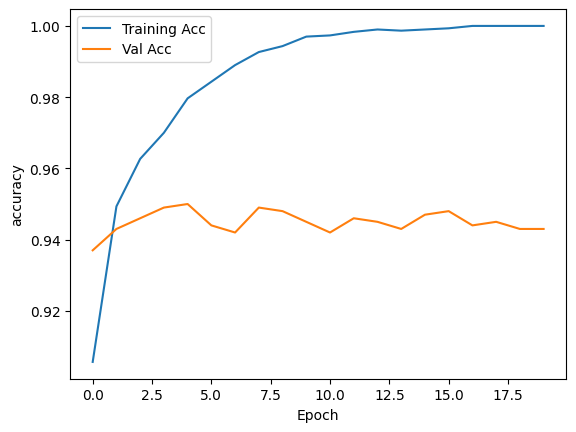

In [117]:
plt.plot(his.history['accuracy'],label='Training Acc')

plt.plot(his.history['val_accuracy'],label='Val Acc')

plt.xlabel('Epoch')
plt.ylabel('accuracy')
plt.legend()
plt.show()

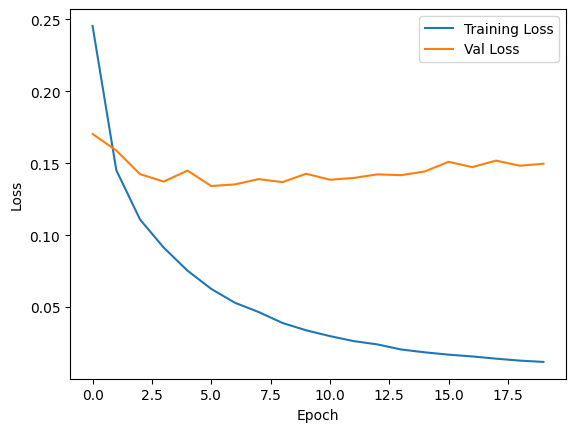

In [58]:
plt.plot(his.history['loss'],label='Training Loss')
plt.plot(his.history['val_loss'],label='Val Loss')

plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [78]:
model_pre.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 128, 128, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 128, 128, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 64, 64, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 64, 64, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 64, 64, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 32, 32, 128)       0     

In [59]:
data_process("./evaluation","./Food-5K/evaluation/")

500
500


In [155]:
# Image generator with image augmentation
aug_gen = ImageDataGenerator(rescale=1./255,
                             rotation_range=45,
                             horizontal_flip=True,
                             zoom_range=0.3)

In [130]:
aug_images = aug_gen.flow_from_directory(batch_size=32,
                                         directory="./train_data",
                                         shuffle=True,
                                         target_size=(128, 128),
                                         class_mode='binary')

Found 3000 images belonging to 2 classes.


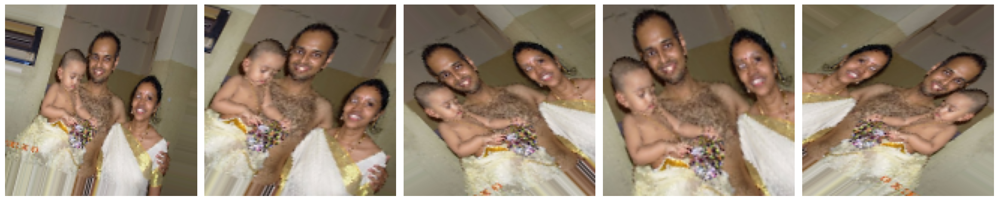

In [131]:
augmented_images = [aug_images[0][0][0] for i in range(5)]
plotImages(augmented_images)

In [132]:
base_model2 = VGG16(input_shape = (128, 128, 3), # Shape of our images
include_top = False, # Leave out the last fully connected layer
weights = 'imagenet')

In [133]:
for layer in base_model2.layers:
    layer.trainable = False

In [134]:
x2 = Flatten()(base_model2.output)

In [135]:
predictions2 = Dense(1, activation='sigmoid')(x2)

In [136]:
model_pre2 = Model(inputs=base_model2.input, outputs=predictions2)

In [137]:
model_pre2.compile(optimizer=keras.optimizers.Adam(0.001),loss='binary_crossentropy',metrics=['accuracy'])

In [138]:
his2 = model_pre2.fit(aug_images, epochs=20, validation_data=val_data_gen)


Epoch 1/20
94/94 [==============================] - 27s 276ms/step - loss: 0.3750 - accuracy: 0.8277 - val_loss: 0.1883 - val_accuracy: 0.9260
Epoch 2/20
94/94 [==============================] - 26s 281ms/step - loss: 0.2856 - accuracy: 0.8817 - val_loss: 0.1737 - val_accuracy: 0.9340
Epoch 3/20
94/94 [==============================] - 24s 252ms/step - loss: 0.2371 - accuracy: 0.9017 - val_loss: 0.1556 - val_accuracy: 0.9380
Epoch 4/20
94/94 [==============================] - 27s 291ms/step - loss: 0.2172 - accuracy: 0.9180 - val_loss: 0.1504 - val_accuracy: 0.9380
Epoch 5/20
94/94 [==============================] - 26s 278ms/step - loss: 0.1987 - accuracy: 0.9150 - val_loss: 0.1470 - val_accuracy: 0.9480
Epoch 6/20
94/94 [==============================] - 24s 258ms/step - loss: 0.2022 - accuracy: 0.9170 - val_loss: 0.1481 - val_accuracy: 0.9360
Epoch 7/20
94/94 [==============================] - 24s 256ms/step - loss: 0.1994 - accuracy: 0.9173 - val_loss: 0.1503 - val_accuracy: 0.9410

In [124]:
def moving_average(data, window_size):
    return np.convolve(data, np.ones(window_size) / window_size, mode='valid')


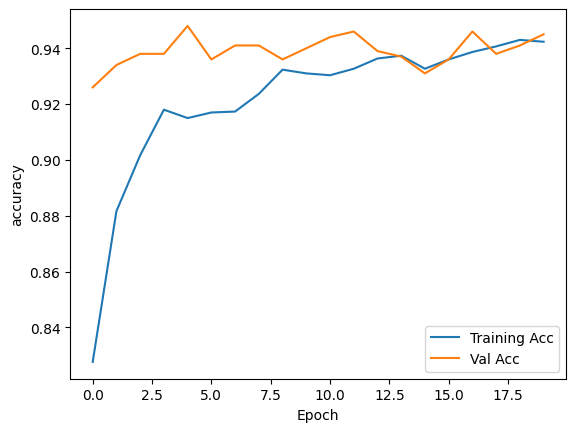

In [153]:


plt.plot(his2.history['accuracy'],label='Training Acc')

plt.plot(his2.history['val_accuracy'],label='Val Acc')

plt.xlabel('Epoch')
plt.ylabel('accuracy')
plt.legend()
plt.show()

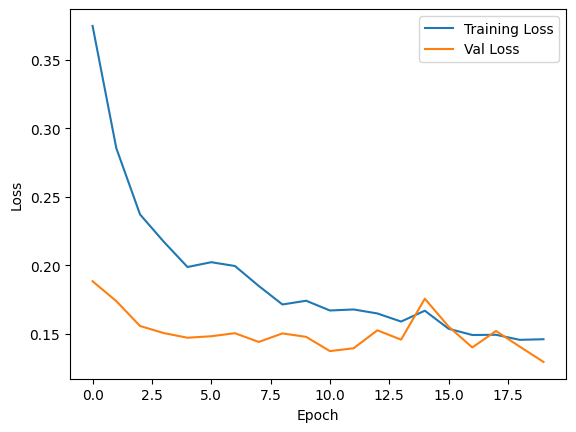

In [154]:
plt.plot(his2.history['loss'],label='Training Loss')
plt.plot(his2.history['val_loss'],label='Val Loss')

plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [170]:
eval_gen = ImageDataGenerator(rescale=1./255)

In [171]:
eval_images = eval_gen.flow_from_directory(batch_size=32,
                                         directory="./evaluation",
                                         shuffle=False,
                                         target_size=(128, 128),
                                         class_mode='binary')

Found 1000 images belonging to 2 classes.


In [175]:
y_true = eval_images.classes

In [172]:
pred1 = model.evaluate(eval_images)

32/32 [==============================] - 5s 152ms/step - loss: 0.6304 - accuracy: 0.8700


In [180]:
y_pred_a = model.predict(eval_images)

32/32 [==============================] - 5s 145ms/step


In [182]:
y_pred_a = (y_pred_a >= 0.5).astype(int)

In [178]:
scorea_ = f1_score(y_pred_a,y_true)

In [179]:
scorea_

0.8673469387755102

In [173]:
pred2 = model_pre.evaluate(eval_images)

32/32 [==============================] - 6s 170ms/step - loss: 0.1540 - accuracy: 0.9450


In [181]:
y_pred_b = model_pre.predict(eval_images)

32/32 [==============================] - 5s 158ms/step


In [183]:
y_pred_b = (y_pred_b >= 0.5).astype(int)

In [184]:
scoreb_ = f1_score(y_pred_b,y_true)

In [185]:
scoreb_

0.9433573635427394

In [174]:
pred3 = model_pre2.evaluate(eval_images)

32/32 [==============================] - 7s 203ms/step - loss: 0.1709 - accuracy: 0.9410


In [186]:
y_pred_c = model_pre2.predict(eval_images)

32/32 [==============================] - 5s 164ms/step


In [187]:
y_pred_c = (y_pred_c >= 0.5).astype(int)

In [188]:
scorec_ = f1_score(y_pred_c,y_true)

In [189]:
scorec_

0.9398572884811417

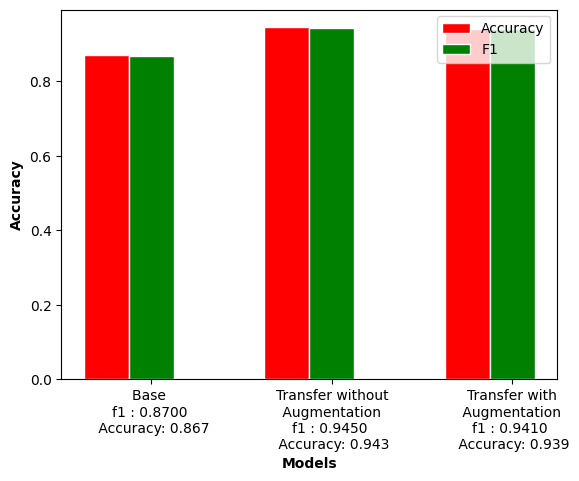

In [8]:
import numpy as np
import matplotlib.pyplot as plt
# The following accuracies were printed running the model and manually entered to plot the histograms
bars1 = [0.8700,0.9450,0.9410]
bars2 = [0.867,0.943,0.939]

# set width of bar. To work and supply some padding
# the number of groups times barWidth must be
# a little less than 1 (since the next group
# will start at 1, then 2, etc).

barWidth = 0.25
# Set position of bar on X axis
r1 = np.arange(len(bars1))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]

# Make the plot
plt.bar(r1, bars1, color='red', width=barWidth, edgecolor='white', label='Accuracy')
plt.bar(r2, bars2, color='green', width=barWidth, edgecolor='white', label='F1')

# Add xticks on the middle of the group bars
plt.xlabel('Models', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(bars1))], ['Base \nf1 : 0.8700 \n Accuracy: 0.867', 'Transfer without\n Augmentation \nf1 : 0.9450 \n Accuracy: 0.943', 'Transfer with\n Augmentation \nf1 : 0.9410 \n Accuracy: 0.939'])

plt.ylabel('Accuracy',fontweight='bold')

# Create legend & Show graphic
plt.legend()
plt.show()

In [ ]:
model_pre2.summary()